### Imports

In [1]:
import os
import pickle
import matplotlib.pyplot as plt
import numpy as np

from skimage.util import invert
from skimage.filters import threshold_otsu
from skimage import io, color, morphology, segmentation

### Functions

In [2]:
def grey_image_transform(image):
    return color.rgb2gray(image)

def binarize_image(image):
    thresh = threshold_otsu(image)
    image = image > thresh
    return image

def get_image_masks(image, luminosity):
    lum = color.rgb2gray(image)
    lum = binarize_image(lum)
    mask = lum
    mask1 = invert(lum)
    mask1 = morphology.remove_small_objects(mask1 < luminosity)
    mask1 = morphology.remove_small_holes(mask1,100)
    mask = morphology.opening(mask, morphology.disk(3))
    mask = invert(mask)
    mask = mask&mask1
    mask = invert(mask)
    return mask1


def plot_images(image, chull):
    fig, axes = plt.subplots(1, 2, figsize=(8, 4))
    ax = axes.ravel()

    ax[0].set_title('Original picture')
    ax[0].imshow(image, cmap=plt.cm.gray)
    ax[0].set_axis_off()

    ax[1].set_title('Transformed picture')
    ax[1].imshow(chull, cmap=plt.cm.gray)
    ax[1].set_axis_off()

    plt.tight_layout()
    plt.show()  

def display_result(img, mask, slic, m_slic):
    # Display result
    fig, ax_arr = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(10, 10))
    ax1, ax2, ax3, ax4 = ax_arr.ravel()

    ax1.imshow(img)
    ax1.set_title('Original image')

    ax2.imshow(mask, cmap='gray')
    ax2.set_title('Mask')

    ax3.imshow(segmentation.mark_boundaries(img, slic))
    ax3.contour(mask, colors='red', linewidths=1)
    ax3.set_title('SLIC')

    ax4.imshow(segmentation.mark_boundaries(img, m_slic))
    ax4.contour(mask, colors='red', linewidths=1)
    ax4.set_title('maskSLIC')

    for ax in ax_arr.ravel():
        ax.set_axis_off()

    plt.tight_layout()
    plt.show()

### Read Data and Get Mask Information

In [3]:
# input_dir = './../../data/images/'
# output_dir = './../../data/results/img_processing/'

input_dir = './../../../temp_data/images/'
output_dir = './../../../temp_data/results/img_processing/'

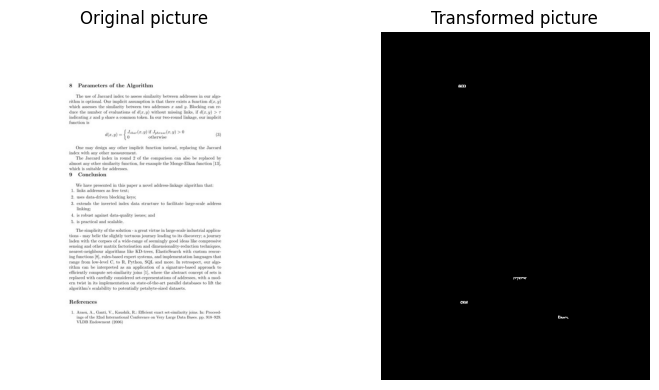

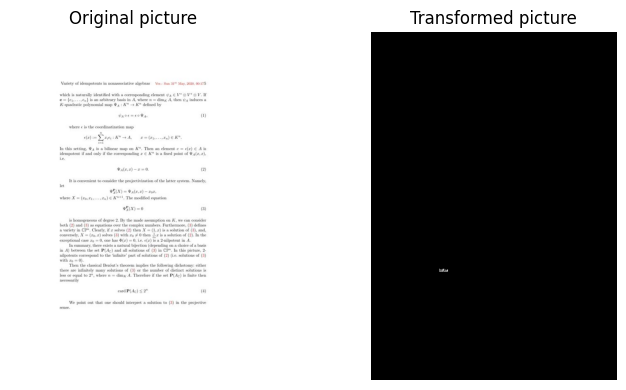

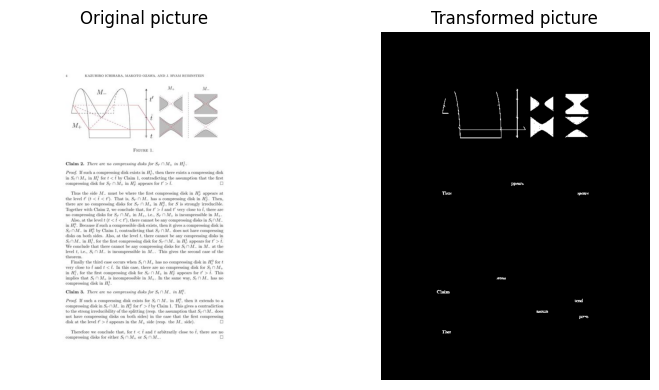

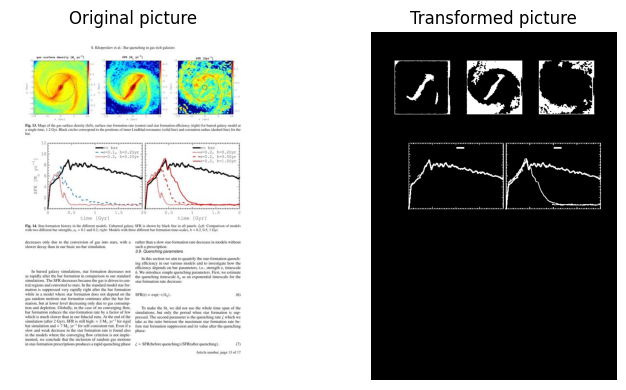

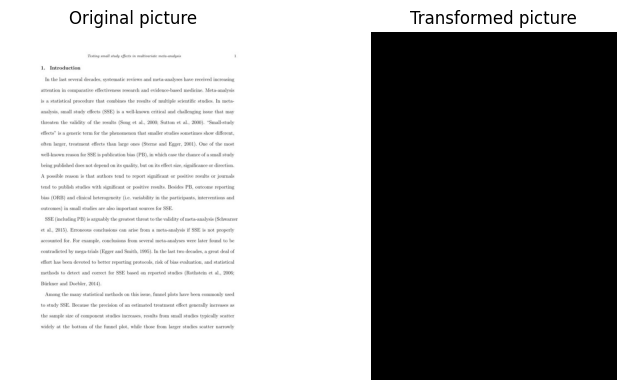

...

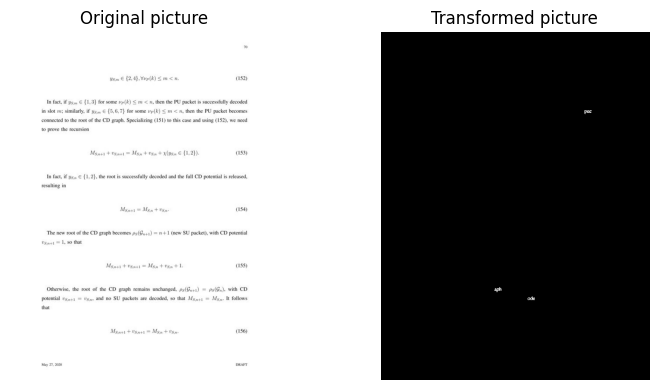

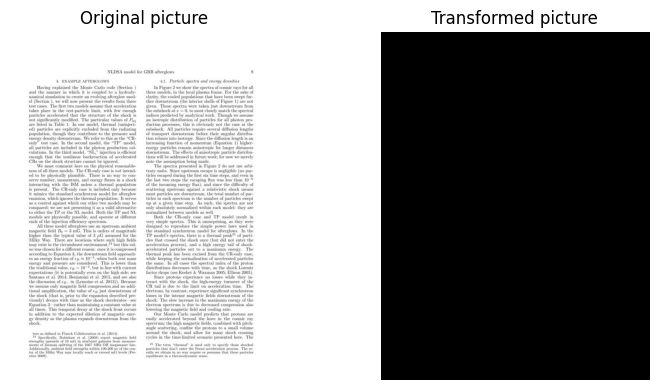

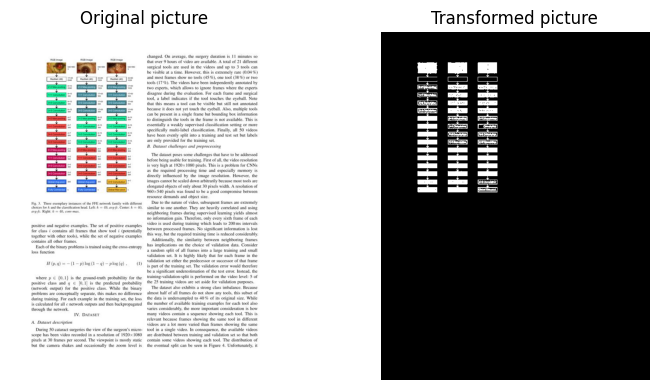

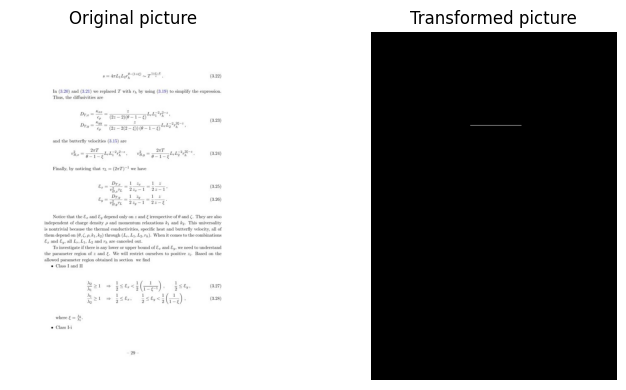

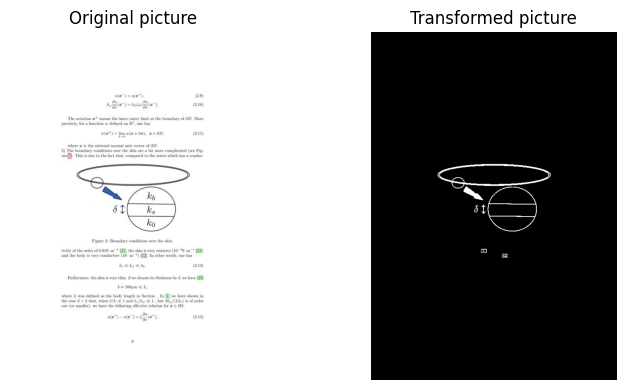

In [4]:
dir_list = os.listdir(input_dir)
results = {}
# count = 0

for image in dir_list:
    img = io.imread(input_dir + image)
    masks = get_image_masks(img,0.7)
    results[image] = masks
    plot_images(img,masks)

### Store Results

In [ ]:
with open(output_dir+'mask_results_morphology_3.pkl', 'wb') as outp:  # Overwrites any existing file.
    pickle.dump(results, outp, pickle.HIGHEST_PROTOCOL)

In [ ]:
dir_list = os.listdir(input_dir)
results = {}

for image in dir_list:
    img = io.imread(input_dir + image)
#     mask = get_image_edges(img)
    lum = color.rgb2gray(img)
    mask = morphology.remove_small_holes(morphology.remove_small_objects(lum < 1.0,4),4)
    mask = morphology.opening(mask, morphology.disk(3))
    results[image] = mask
    plot_images(img,mask)

In [ ]:



values = [0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]
for i in values:
    
    try:
        
        # Input data
        img = io.imread('./../../data/images/docbank_test_page-0001.jpg')
        lum = color.rgb2gray(img)
#         lum = binarize_image(img)
        mask = morphology.remove_small_holes(
            morphology.remove_small_objects(
                lum < i,3),
            3)

        mask = morphology.opening(mask, morphology.disk(3))

        # SLIC result
        slic = segmentation.slic(img, n_segments=200, start_label=1)

        # maskSLIC result
        m_slic = segmentation.slic(img, n_segments=100, mask=mask, start_label=1)
        print("Success : ",str(i))
        display_result(img, mask, slic, m_slic)
    except:
        print(i)

### Example

In [ ]:


# Input data
img = io.imread('./../../data/sample_data/sanbook_page-0001.jpg')
img = invert(img)

# Compute a mask
lum = color.rgb2gray(img)
mask = morphology.remove_small_holes(
    morphology.remove_small_objects(
        lum < 0.3, 5),
    5)

mask = morphology.opening(mask, morphology.disk(3))

# SLIC result
slic = segmentation.slic(img, n_segments=20, start_label=1, compactness=10000)

# maskSLIC result
m_slic = segmentation.slic(img, n_segments=5, mask=mask, start_label=1)

